Date Created: 7-11-2020  
Date modified: 8-11-2020

In [1]:
%load_ext autoreload
%autoreload 1
%aimport graph_functions

In [2]:
import igraph
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import random


# from graph_functions import *
from scipy.odr import ODR, Model, Data, RealData

polynomial = graph_functions.polynomial

In [3]:
%matplotlib inline
# %matplotlib qt5

plt.style.use('default')
plt.rcParams.update({
        "text.usetex": True,
        "font.family": "serif",
        "font.serif": ["Times New Roman"]
    })

# See what happens with Evan's conjecture if we take a node and add edges to it

In [4]:
N = 5000
p = 2
g = igraph.Graph.Erdos_Renyi(N, 2*p/N)
# g = igraph.Graph.Barabasi(N, 2)
g = max(g.decompose(), key=igraph.Graph.vcount)

In [5]:

total_d=[]
total_c=[]

for i in range(7):
    g.add_vertex()
    new_node = g.vcount() - 1
    d_list = []
    c_list = []

    for i in random.sample(set(range(0,new_node)), new_node):        
        g.add_edge(new_node, i)
        
        c_list.append(g.closeness(new_node))
        d_list.append(g.degree(new_node))
        
    total_d.append(d_list)
    total_c.append(c_list)

    g.delete_vertices(new_node)

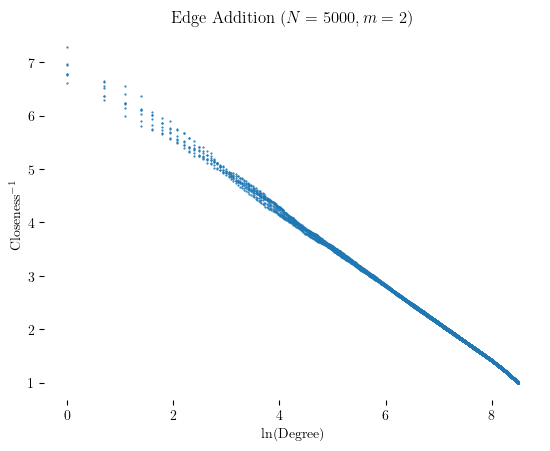

In [6]:
fig, ax = plt.subplots()

for ds, cs in zip(total_d, total_c):
    # plt.plot(np.log(ds), 1/np.array(cs), linewidth=0.7)
    plt.scatter(np.log(ds), 1/np.array(cs), s=0.3, c='tab:blue')


plt.title(f"Edge Addition $(N = {N}, m={p})$")
plt.xlabel('ln(Degree)')
plt.ylabel('Closeness$^{-1}$')

for s in ax.spines:
    ax.spines[s].set_visible(False)
# ax.spines['right'].set_visible(False)
# ax.spines['top'].set_visible(False)

plt.show()


In [7]:
# d_log = [np.log(d) for d in d_list for d_list in total_d]
# c_inv = [1/np.array(c) for c in c_list for c_list in total_c]

d_log = []
c_inv = []

for d_list, c_list in zip(total_d, total_c):
    for d, c in zip(d_list, c_list):
        d_log.append(np.log(d))
        c_inv.append(1/c)

In [8]:
odr_out = ODR(Data(d_log, c_inv), Model(polynomial), [1,-1]).run()

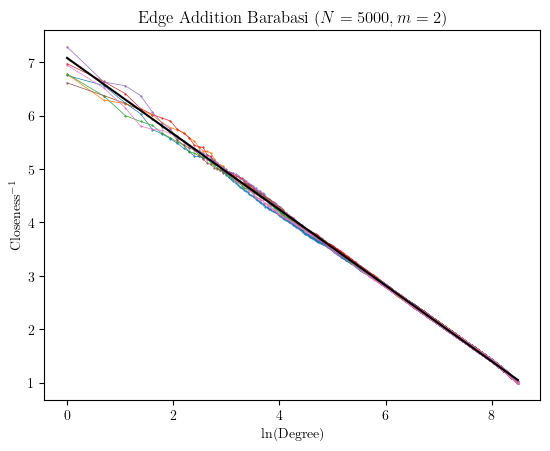

In [9]:
# plt.scatter(d_log, c_inv, s=1)

for ds, cs in zip(total_d, total_c):
    plt.plot(np.log(ds), 1/np.array(cs), linewidth=0.5)
    plt.scatter(np.log(ds), 1/np.array(cs), s=0.3)

x_line = np.linspace(0,max(d_log),10)
plt.plot(x_line, polynomial(odr_out.beta, x_line), linewidth=1.5, c='black')
plt.title(f"Edge Addition Barabasi $(N = {N}, m={p})$")
plt.xlabel('ln(Degree)')
plt.ylabel('Closeness$^{-1}$')
plt.show()

In [10]:
d = np.array(g.degree())
z_exp = np.average(d**2) / np.average(d) - 1

z = np.exp(-1/odr_out.beta[1])
z_err = np.sqrt((((1/odr_out.beta[1]) * z)*odr_out.sd_beta[1])**2)

In [11]:
# z for the new techinque
z_exp, z, z_err

(4.035770907649624, 4.092592548368981, 0.0006158626526841747)

In [12]:
d_np = np.array(g.degree())
c_np = np.array(g.closeness())
d_l = np.log(d_np)
c_i = 1 / c_np

In [13]:
odr_out_2 = ODR(Data(d_l, c_i), Model(polynomial), [1,-1])
odr_out_2.set_job(fit_type=2)
odr_out_2 = odr_out_2.run()

No handles with labels found to put in legend.


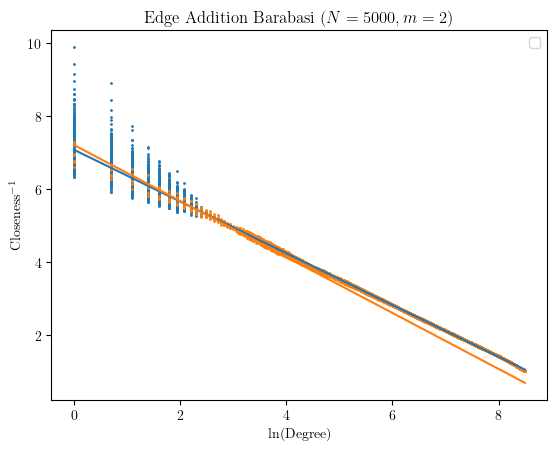

In [14]:
plt.scatter(d_l, c_i, s=1)
plt.plot(x_line, polynomial(odr_out.beta, x_line), 
# label='odr_out'
)
plt.plot(x_line, polynomial(odr_out_2.beta, x_line), 
# label='odr_out_2'
)
plt.scatter(d_log, c_inv, s=1)
plt.legend()
plt.title(f"Edge Addition Barabasi $(N = {N}, m={p})$")
plt.xlabel('ln(Degree)')
plt.ylabel('Closeness$^{-1}$')
plt.show()

In [15]:
z_exp = np.average(d**2) / np.average(d) - 1

z = np.exp(-1/odr_out_2.beta[1])
z_err = np.sqrt((((1/odr_out_2.beta[1]) * z)*odr_out_2.sd_beta[1])**2)

# Results
## General
- For a sparse Erdos graph (largest connected component) we get a remarkably straight line!
- For a denser graph we get some artefacting towards the end of the graph
- This is amazingly good results for the Erdos graph. Proves that the relationship holds without a doubt for the sparse limit.

In [16]:
# z for the old techinque
z_exp,z

(4.035770907649624, 3.678556113390597)

In [17]:
chi2 = graph_functions.chi_squared(d_l,c_i, polynomial, odr_out_2.beta, pearson=False)

In [18]:
chi2/len(d_l)

1.0024977377823547